<a href="https://colab.research.google.com/github/kanika26187/first-project/blob/main/Advance_Python_Assignment.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#PART I-Process Automation
#Q1. CREATE A FILE THAT CONTAINS 1000 LINES OF RANDOM STRINGS
import random
import string

# Function to generate a random string of given length
def generate_random_string(length=10):
    letters = string.ascii_letters + string.digits
    return ''.join(random.choice(letters) for _ in range(length))

# Create and open the file in write mode
with open("random_strings.txt", "w") as file:
    for _ in range(1000):
        random_str = generate_random_string(12)  # each string is 12 characters long
        file.write(random_str + "\n")

print("File 'random_strings.txt' created with 1000 random strings.")


File 'random_strings.txt' created with 1000 random strings.


In [ ]:
#Q2.create a file that contains multiple lines of random strings and file size must be 5MB
import random
import string

def generate_random_string(length=100):
    chars = string.ascii_letters + string.digits
    return ''.join(random.choice(chars) for _ in range(length))

filename = "random_5mb.txt"
target_size = 5 * 1024 * 1024  # 5 MB

with open(filename, "w") as file:
    while file.tell() < target_size:
        line = generate_random_string(100)
        file.write(line + "\n")
    print(f"{filename} created with size: {file.tell()} bytes.")


random_5mb.txt created with size: 5242910 bytes.


In [ ]:
#Q3. create 10 files that contains multiple lines of random strings and file size of each file must be 5MB
import random
import string
import os

def generate_random_string(length=100):
    chars = string.ascii_letters + string.digits
    return ''.join(random.choice(chars) for _ in range(length))

target_size = 5 * 1024 * 1024  # 5 MB

for i in range(1, 11):
    filename = f"random_file_{i}.txt"
    with open(filename, "w") as file:
        while file.tell() < target_size:
            line = generate_random_string(100)
            file.write(line + "\n")
        print(f"{filename} created with size: {file.tell()} bytes.")


random_file_1.txt created with size: 5242910 bytes.
random_file_2.txt created with size: 5242910 bytes.
random_file_3.txt created with size: 5242910 bytes.
random_file_4.txt created with size: 5242910 bytes.
random_file_5.txt created with size: 5242910 bytes.
random_file_6.txt created with size: 5242910 bytes.
random_file_7.txt created with size: 5242910 bytes.
random_file_8.txt created with size: 5242910 bytes.
random_file_9.txt created with size: 5242910 bytes.
random_file_10.txt created with size: 5242910 bytes.


In [ ]:
#Q4. CREATE 5 files of size 1GB,2GB,3GB,4GB,5GB FILE CONTAINS MULTIPLE LINES OF RANDOM STRINGS
import os
import random
import string

# Parameters
line_length = 100              # Length of each random string
lines_per_block = 10000        # Number of lines per block
sizes_gb = [1, 2, 3, 4, 5]     # Target file sizes in GB

# Generate a block of lines once (reused)
def generate_block():
    chars = string.ascii_letters + string.digits
    return ''.join(
        ''.join(random.choices(chars, k=line_length)) + '\n'
        for _ in range(lines_per_block)
    )

# Main loop to create files
for size in sizes_gb:
    target_bytes = size * 1024 * 1024 * 1024
    filename = f"random_file_{size}GB.txt"
    print(f"Creating {filename}...")

    with open(filename, "w") as f:
        written = 0
        while written < target_bytes:
            block = generate_block()
            f.write(block)
            written += len(block.encode())

    actual_size = os.path.getsize(filename) / (1024**3)
    print(f"✅ {filename} created: {actual_size:.2f} GB\n")


Creating random_file_1GB.txt...
✅ random_file_1GB.txt created: 1.00 GB

Creating random_file_2GB.txt...
✅ random_file_2GB.txt created: 2.00 GB

Creating random_file_3GB.txt...
✅ random_file_3GB.txt created: 3.00 GB

Creating random_file_4GB.txt...
✅ random_file_4GB.txt created: 4.00 GB

Creating random_file_5GB.txt...
✅ random_file_5GB.txt created: 5.00 GB



In [ ]:
#Q5. CONVERT ALL FILES OF Q4 INTO UPPERCASE ONE BY ONE
import os

# Loop through each file from 1GB to 5GB
for size in range(1, 6):
    input_filename = f"random_file_{size}GB.txt"
    output_filename = f"random_file_{size}GB_UPPER.txt"

    print(f"Converting {input_filename} to uppercase...")

    with open(input_filename, "r") as infile, open(output_filename, "w") as outfile:
        for line in infile:
            outfile.write(line.upper())

    print(f"✅ {output_filename} created.")


Converting random_file_1GB.txt to uppercase...
✅ random_file_1GB_UPPER.txt created.
Converting random_file_2GB.txt to uppercase...
✅ random_file_2GB_UPPER.txt created.
Converting random_file_3GB.txt to uppercase...
✅ random_file_3GB_UPPER.txt created.
Converting random_file_4GB.txt to uppercase...
✅ random_file_4GB_UPPER.txt created.
Converting random_file_5GB.txt to uppercase...
✅ random_file_5GB_UPPER.txt created.


In [ ]:
#Q6. CONVERT ALL FILES OF Q4 INTO UPPER CASE PARALLEL USING MULTITHREADING
import threading

# Function to convert a single file to uppercase
def convert_to_uppercase(size):
    input_filename = f"random_file_{size}GB.txt"
    output_filename = f"random_file_{size}GB_UPPER.txt"

    print(f"[Thread-{size}] Starting conversion of {input_filename}...")

    with open(input_filename, "r") as infile, open(output_filename, "w") as outfile:
        for line in infile:
            outfile.write(line.upper())

    print(f"[Thread-{size}] ✅ Conversion complete: {output_filename}")

# Create and start threads
threads = []
for size in range(1, 6):  # From 1GB to 5GB
    thread = threading.Thread(target=convert_to_uppercase, args=(size,))
    threads.append(thread)
    thread.start()

# Wait for all threads to finish
for thread in threads:
    thread.join()

print("✅ All files converted to uppercase in parallel.")


[Thread-1] Starting conversion of random_file_1GB.txt...
[Thread-2] Starting conversion of random_file_2GB.txt...
[Thread-3] Starting conversion of random_file_3GB.txt...
[Thread-4] Starting conversion of random_file_4GB.txt...
[Thread-5] Starting conversion of random_file_5GB.txt...
[Thread-1] ✅ Conversion complete: random_file_1GB_UPPER.txt
[Thread-2] ✅ Conversion complete: random_file_2GB_UPPER.txt
[Thread-3] ✅ Conversion complete: random_file_3GB_UPPER.txt
[Thread-4] ✅ Conversion complete: random_file_4GB_UPPER.txt
[Thread-5] ✅ Conversion complete: random_file_5GB_UPPER.txt
✅ All files converted to uppercase in parallel.


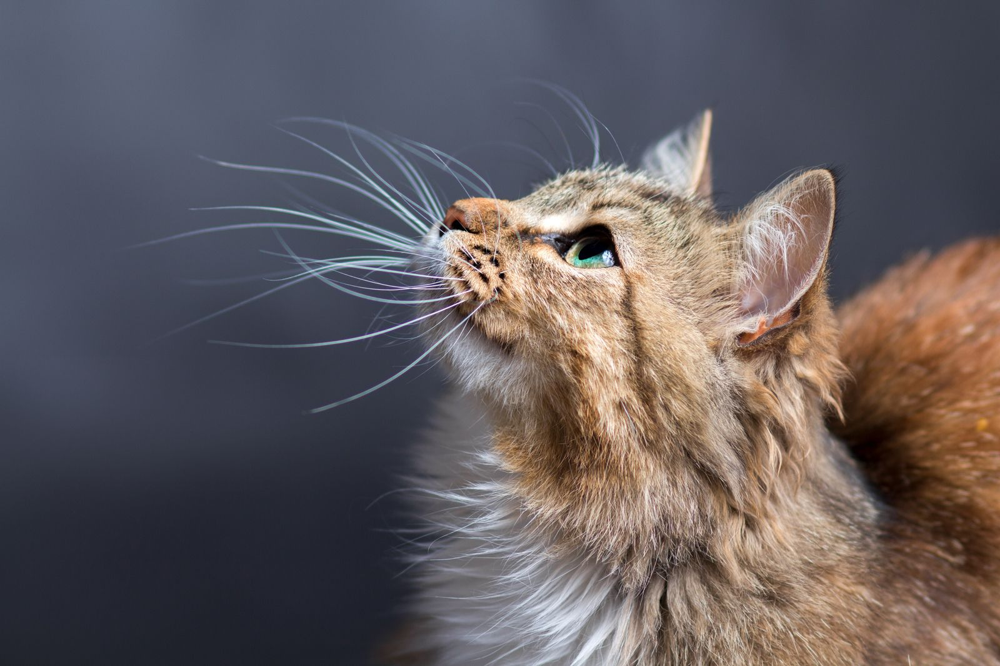

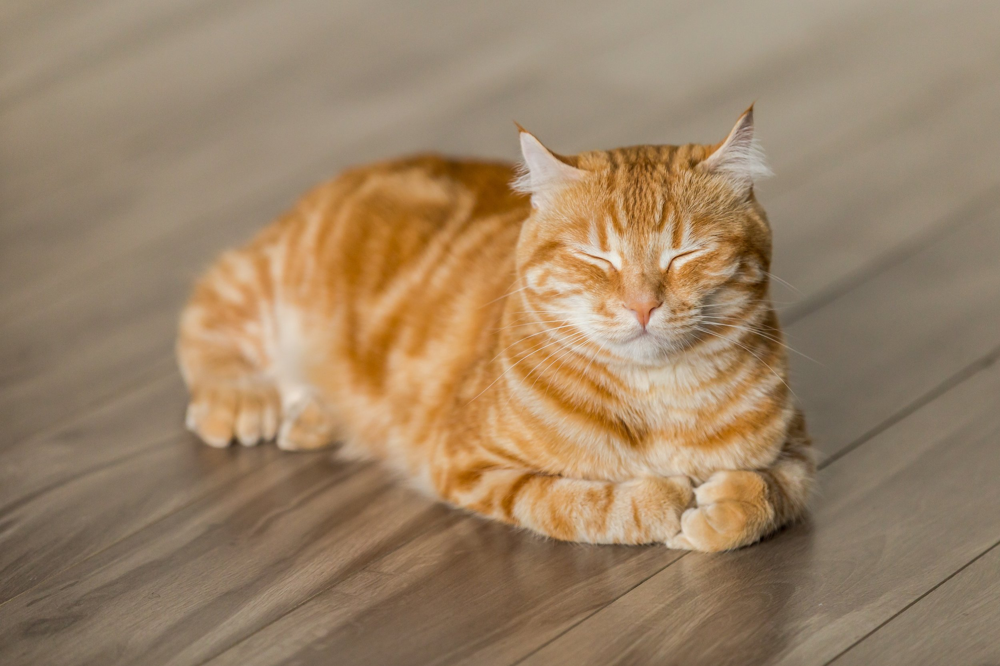

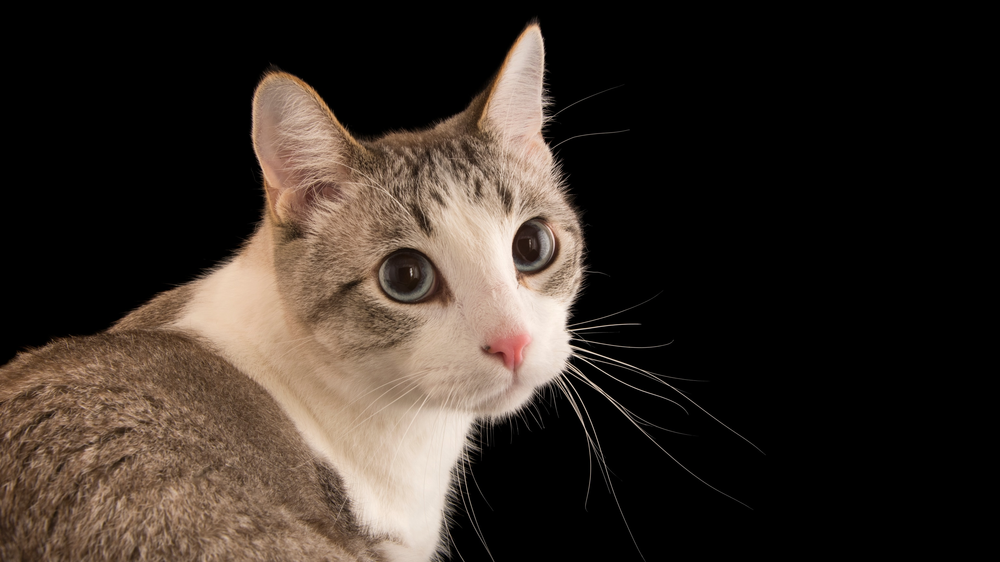

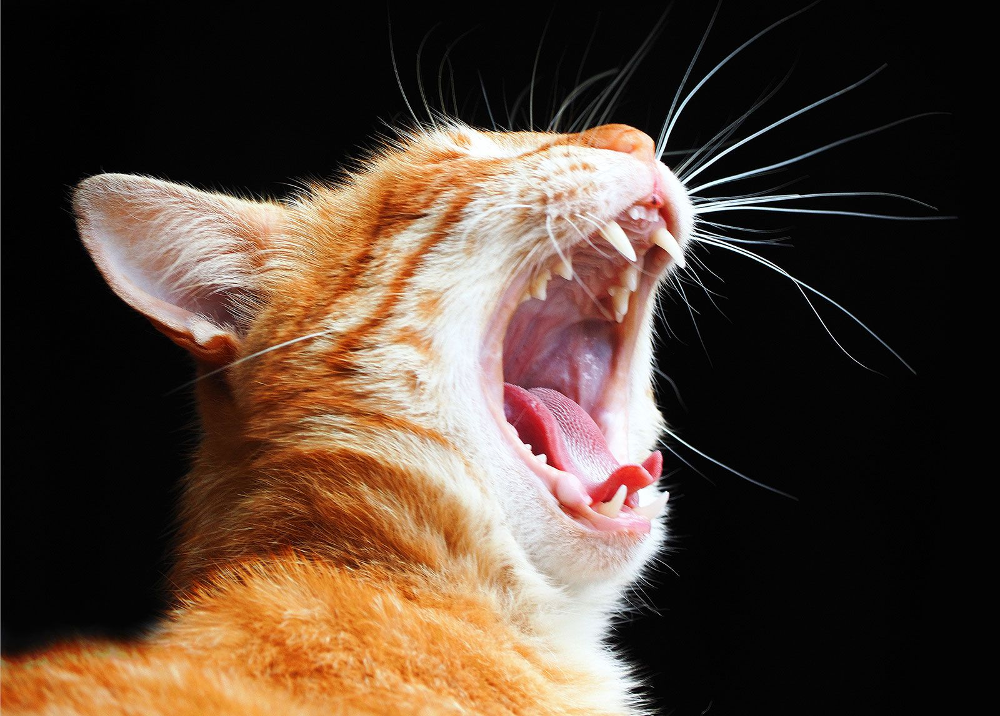

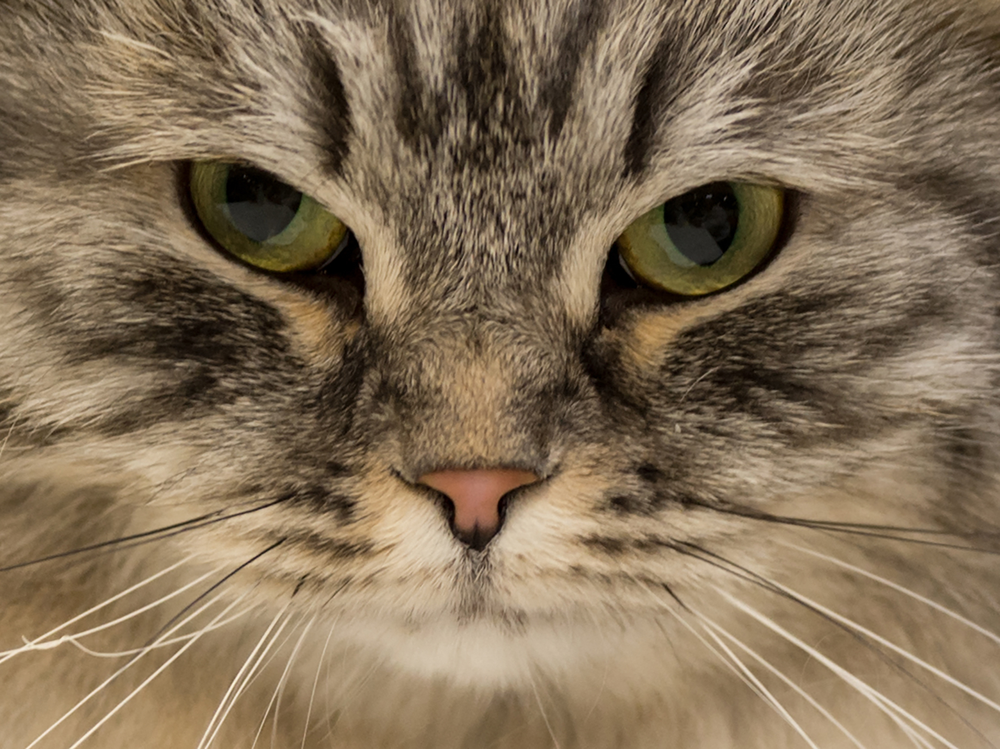

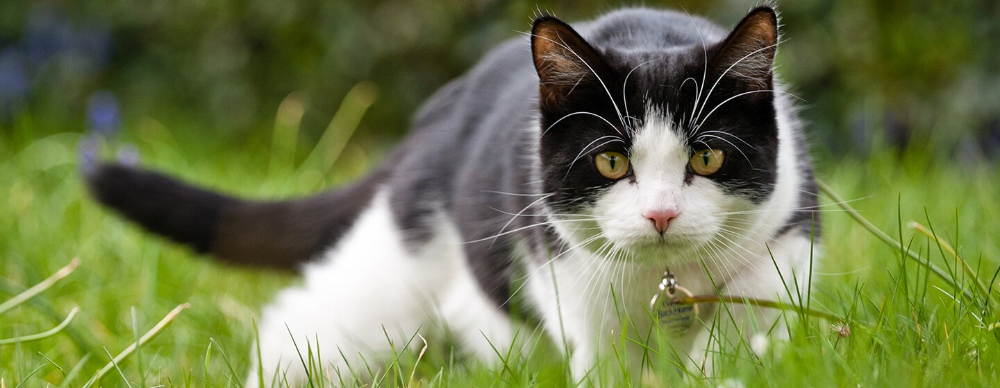

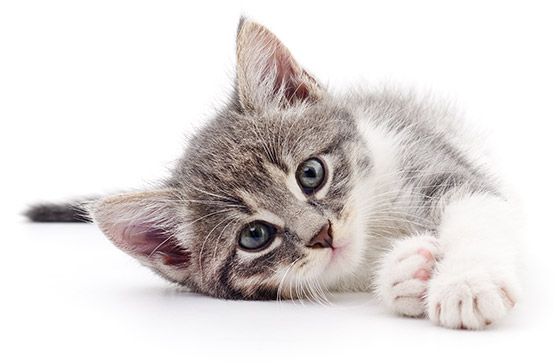

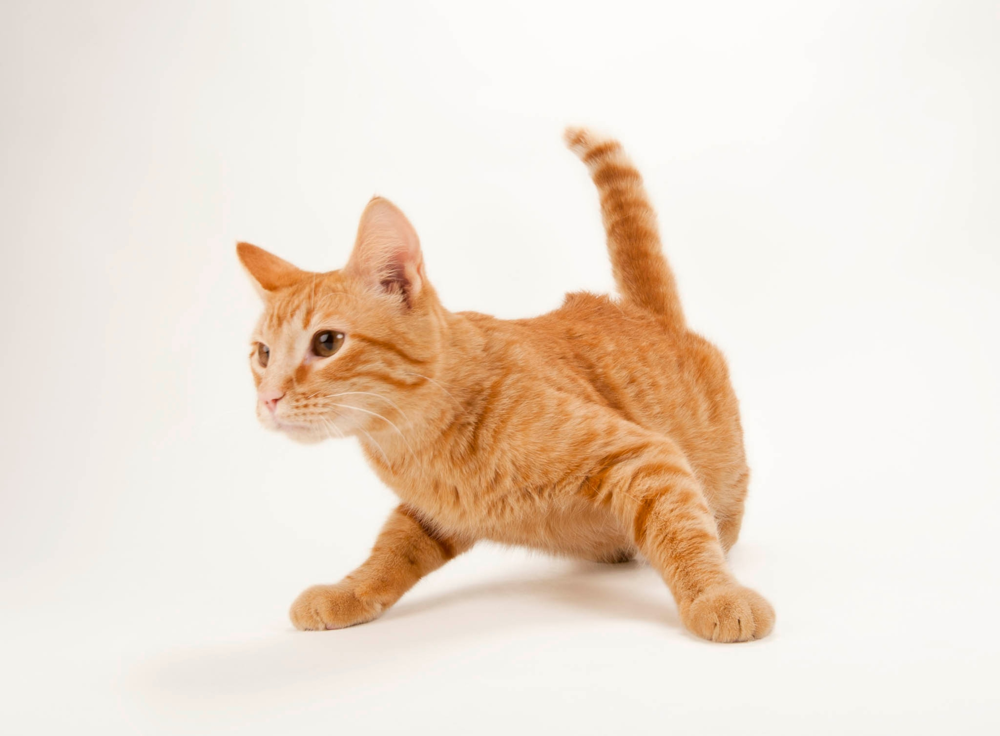

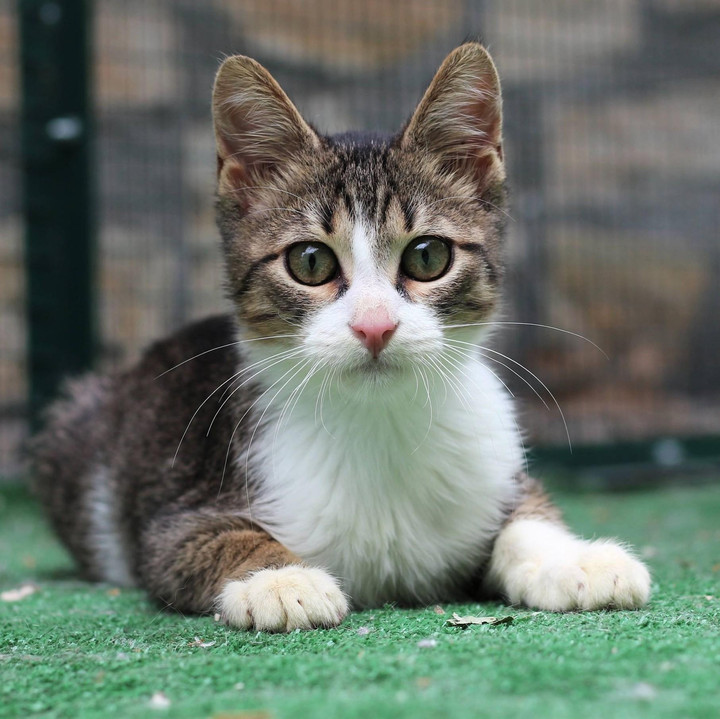

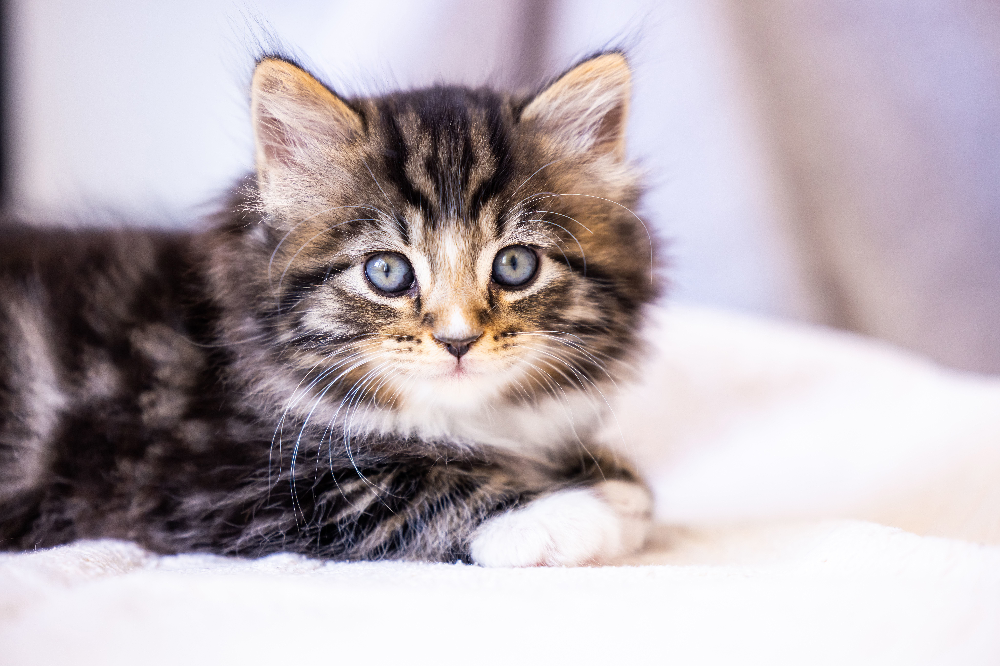

In [ ]:
#Q7. WAP TP AUTOMATICALLY DOWNLOAD 10 IMAGES OF CAT FROM GOOGLR IMAGES
!pip install icrawler


# Step 2: Import and use the package
from icrawler.builtin import GoogleImageCrawler

# Step 3: Create a crawler object and download images
google_crawler = GoogleImageCrawler(storage={'root_dir': 'cat_images'})
google_crawler.crawl(keyword='cat', max_num=10)
import os
from IPython.display import Image, display

for filename in os.listdir('cat_images'):
    if filename.endswith('.jpg') or filename.endswith('.png'):
        display(Image(filename=os.path.join('cat_images', filename)))




In [ ]:
#Q8: Download 10 Machine Learning videos from YouTube

!pip install yt_dlp
# ------------------------- Q8 (Best Version using yt_dlp) -------------------------
import yt_dlp

search_term = "Machine Learning"
max_videos = 10

ydl_opts = {
    'format': 'mp4',
    'outtmpl': 'q8_video_%(title).50s.%(ext)s',  # save with readable titles
    'noplaylist': True
}

with yt_dlp.YoutubeDL(ydl_opts) as ydl:
    ydl.download([f"ytsearch{max_videos}:{search_term}"])

print("✅ Q8: 10 Machine Learning videos downloaded successfully using yt_dlp.")

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 174.3/174.3 kB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 43.9 MB/s eta 0:00:00
[youtube:search] Extracting URL: ytsearch10:Machine Learning
[download] Downloading playlist: Machine Learning
[youtube:search] query "Machine Learning": Downloading web client config
[youtube:search] query "Machine Learning" page 1: Downloading API JSON
[youtube:search] Playlist Machine Learning: Downloading 10 items of 10
[download] Downloading item 1 of 10
[youtube] Extracting URL: https://www.youtube.com/watch?v=ukzFI9rgwfU
[youtube] ukzFI9rgwfU: Downloading webpage
[youtube] ukzFI9rgwfU: Downloading tv client config
[youtube] ukzFI9rgwfU: Downloading player 94f771d8-main
[youtube] ukzFI9rgwfU: Downloading tv player API JSON
[youtube] ukzFI9rgwfU: Downloading ios player API JSON
[youtube] ukzFI9rgwfU: Downloading m3u8 information
[info] ukzFI9rgwfU: Downloading 1 format(s): 18
[download] Destination: q8_video_Machine Learning 

In [ ]:
#Q9. CONVERT ALL VIDEOS OF Q8 INTO AUDIO
!pip install moviepy
import os
from moviepy.editor import VideoFileClip

# Folder where videos are saved (current directory)
video_files = [f for f in os.listdir() if f.startswith("q8_video_") and f.endswith(".mp4")]

# Convert each video to MP3
for video_file in video_files:
    try:
        video = VideoFileClip(video_file)
        audio_filename = video_file.rsplit(".", 1)[0] + ".mp3"
        video.audio.write_audiofile(audio_filename)
        print(f"✅ Converted: {video_file} → {audio_filename}")
    except Exception as e:
        print(f"❌ Failed to convert {video_file}: {e}")


MoviePy - Writing audio in q8_video_Scikit-learn Crash Course - Machine Learning Libra.mp3


MoviePy - Done.
✅ Converted: q8_video_Scikit-learn Crash Course - Machine Learning Libra.mp4 → q8_video_Scikit-learn Crash Course - Machine Learning Libra.mp3
MoviePy - Writing audio in q8_video_Machine Learning ｜ What Is Machine Learning？ ｜ Int.mp3


MoviePy - Done.
✅ Converted: q8_video_Machine Learning ｜ What Is Machine Learning？ ｜ Int.mp4 → q8_video_Machine Learning ｜ What Is Machine Learning？ ｜ Int.mp3
MoviePy - Writing audio in q8_video_Complete Machine Learning In 6 Hours｜ Krish Naik.mp3


MoviePy - Done.
✅ Converted: q8_video_Complete Machine Learning In 6 Hours｜ Krish Naik.mp4 → q8_video_Complete Machine Learning In 6 Hours｜ Krish Naik.mp3
MoviePy - Writing audio in q8_video_All Machine Learning algorithms explained in 17 mi.mp3


MoviePy - Done.
✅ Converted: q8_video_All Machine Learning algorithms explained in 17 mi.mp4 → q8_video_All Machine Learning algorithms explained in 17 mi.mp3
MoviePy - Writing audio in q8_video_Machine Learning for Everybody – Full Course.mp3


MoviePy - Done.
✅ Converted: q8_video_Machine Learning for Everybody – Full Course.mp4 → q8_video_Machine Learning for Everybody – Full Course.mp3
MoviePy - Writing audio in q8_video_Stanford CS229 I Machine Learning I Building Large.mp3


MoviePy - Done.
✅ Converted: q8_video_Stanford CS229 I Machine Learning I Building Large.mp4 → q8_video_Stanford CS229 I Machine Learning I Building Large.mp3
MoviePy - Writing audio in q8_video_Ensemble Learning in Machine Learning​ ｜ Decision .mp3


MoviePy - Done.
✅ Converted: q8_video_Ensemble Learning in Machine Learning​ ｜ Decision .mp4 → q8_video_Ensemble Learning in Machine Learning​ ｜ Decision .mp3
MoviePy - Writing audio in q8_video_PyTorch for Deep Learning & Machine Learning – Ful.mp3


MoviePy - Done.
✅ Converted: q8_video_PyTorch for Deep Learning & Machine Learning – Ful.mp4 → q8_video_PyTorch for Deep Learning & Machine Learning – Ful.mp3
MoviePy - Writing audio in q8_video_Machine Learning Explained in 100 Seconds.mp3


MoviePy - Done.
✅ Converted: q8_video_Machine Learning Explained in 100 Seconds.mp4 → q8_video_Machine Learning Explained in 100 Seconds.mp3
MoviePy - Writing audio in q8_video_Machine Learning Fundamentals： Bias and Variance.mp3


MoviePy - Done.
✅ Converted: q8_video_Machine Learning Fundamentals： Bias and Variance.mp4 → q8_video_Machine Learning Fundamentals： Bias and Variance.mp3


In [29]:
#Q10. AUTOMATIC DOWNLOAD OF 100 VIDEOS FROM YOU TUBE CONVERT IT TO AUDIO
!pip install yt_dlp moviepy
import os
from moviepy.editor import VideoFileClip
from concurrent.futures import ThreadPoolExecutor, as_completed
import yt_dlp

# Settings
SEARCH_TERM = "Machine Learning"
MAX_VIDEOS = 100
MAX_THREADS = 10  # Control how many videos are converted simultaneously

# Step 1: Download 100 YouTube videos
def download_videos():
    ydl_opts = {
        'format': 'mp4',
        'outtmpl': 'q8_video_%(title).50s.%(ext)s',
        'noplaylist': True
    }

    with yt_dlp.YoutubeDL(ydl_opts) as ydl:
        ydl.download([f"ytsearch{MAX_VIDEOS}:{SEARCH_TERM}"])

# Step 2: Convert a single video to MP3
def convert_to_audio(video_file):
    try:
        clip = VideoFileClip(video_file)
        audio_file = video_file.rsplit(".", 1)[0] + ".mp3"
        clip.audio.write_audiofile(audio_file, verbose=False, logger=None)
        print(f"✅ Converted: {video_file} → {audio_file}")
        clip.close()
    except Exception as e:
        print(f"❌ Error converting {video_file}: {e}")

# Step 3: Multithreaded conversion
def convert_all_videos_to_audio():
    video_files = [f for f in os.listdir() if f.startswith("q8_video_") and f.endswith(".mp4")]

    with ThreadPoolExecutor(max_workers=MAX_THREADS) as executor:
        futures = [executor.submit(convert_to_audio, vf) for vf in video_files]
        for future in as_completed(futures):
            future.result()

# Step 4: Run pipeline
if __name__ == "__main__":
    print("🚀 Starting download of 100 videos...")
    download_videos()
    print("📥 Download complete. Now converting to audio...")
    convert_all_videos_to_audio()
    print("🎧 All videos converted to audio successfully!")


🚀 Starting download of 100 videos...
[youtube:search] Extracting URL: ytsearch100:Machine Learning
[download] Downloading playlist: Machine Learning
[youtube:search] query "Machine Learning": Downloading web client config
[youtube:search] query "Machine Learning" page 1: Downloading API JSON
[youtube:search] query "Machine Learning" page 2: Downloading API JSON
[youtube:search] query "Machine Learning" page 3: Downloading API JSON
[youtube:search] query "Machine Learning" page 4: Downloading API JSON
[youtube:search] query "Machine Learning" page 5: Downloading API JSON
[youtube:search] query "Machine Learning" page 6: Downloading API JSON
[youtube:search] Playlist Machine Learning: Downloading 100 items of 100
[download] Downloading item 1 of 100
[youtube] Extracting URL: https://www.youtube.com/watch?v=ukzFI9rgwfU
[youtube] ukzFI9rgwfU: Downloading webpage


[youtube] ukzFI9rgwfU: Downloading tv client config
[youtube] ukzFI9rgwfU: Downloading tv player API JSON
[youtube] ukzFI9rgwfU: Downloading ios player API JSON
[youtube] ukzFI9rgwfU: Downloading web player API JSON


ERROR: [youtube] ukzFI9rgwfU: Sign in to confirm you’re not a bot. Use --cookies-from-browser or --cookies for the authentication. See  https://github.com/yt-dlp/yt-dlp/wiki/FAQ#how-do-i-pass-cookies-to-yt-dlp  for how to manually pass cookies. Also see  https://github.com/yt-dlp/yt-dlp/wiki/Extractors#exporting-youtube-cookies  for tips on effectively exporting YouTube cookies


DownloadError: ERROR: [youtube] ukzFI9rgwfU: Sign in to confirm you’re not a bot. Use --cookies-from-browser or --cookies for the authentication. See  https://github.com/yt-dlp/yt-dlp/wiki/FAQ#how-do-i-pass-cookies-to-yt-dlp  for how to manually pass cookies. Also see  https://github.com/yt-dlp/yt-dlp/wiki/Extractors#exporting-youtube-cookies  for tips on effectively exporting YouTube cookies

In [ ]:
#Q11.AUTOMATIC DOWNLOAD OF 500 IMAGES OF DOG FROM GOOGLE IMAGES RESCALE IT TO50%
!pip install icrawler pillow
import os
from PIL import Image
from icrawler.builtin import GoogleImageCrawler
from concurrent.futures import ThreadPoolExecutor, as_completed

# 1️⃣ Create directory to store images
image_dir = "dog_images"
os.makedirs(image_dir, exist_ok=True)

# 2️⃣ Download 500 dog images from Google Images
def download_images():
    crawler = GoogleImageCrawler(storage={'root_dir': image_dir})
    crawler.crawl(keyword='dog', max_num=500)
    print("✅ Download complete.")

# 3️⃣ Resize one image to 50%
def resize_image(img_path):
    try:
        with Image.open(img_path) as img:
            w, h = img.size
            new_img = img.resize((w // 2, h // 2))
            new_img.save(img_path)
            print(f"✅ Resized: {img_path}")
    except Exception as e:
        print(f"❌ Error resizing {img_path}: {e}")

# 4️⃣ Multithreaded rescaling
def rescale_images():
    image_files = [os.path.join(image_dir, f) for f in os.listdir(image_dir)
                   if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

    with ThreadPoolExecutor(max_workers=10) as executor:
        futures = [executor.submit(resize_image, img) for img in image_files]
        for future in as_completed(futures):
            future.result()

# 5️⃣ Run the full pipeline
if __name__ == "__main__":
    print("🚀 Starting download of dog images...")
    download_images()

    print("🎨 Rescaling all images to 50%...")
    rescale_images()

    print("🏁 Pipeline complete.")


🚀 Starting download of dog images...


Exception in thread parser-001:
Traceback (most recent call last):
  File "/usr/lib/python3.11/threading.py", line 1045, in _bootstrap_inner
    self.run()
  File "/usr/lib/python3.11/threading.py", line 982, in run
    self._target(*self._args, **self._kwargs)
  File "/usr/local/lib/python3.11/dist-packages/icrawler/parser.py", line 93, in worker_exec
    for task in self.parse(response, **kwargs):
TypeError: 'NoneType' object is not iterable


✅ Download complete.
🎨 Rescaling all images to 50%...
✅ Resized: dog_images/000001.jpg
🏁 Pipeline complete.


🔢 Number of rows with missing values: 100
🔢 Number of missing values after fill: 0


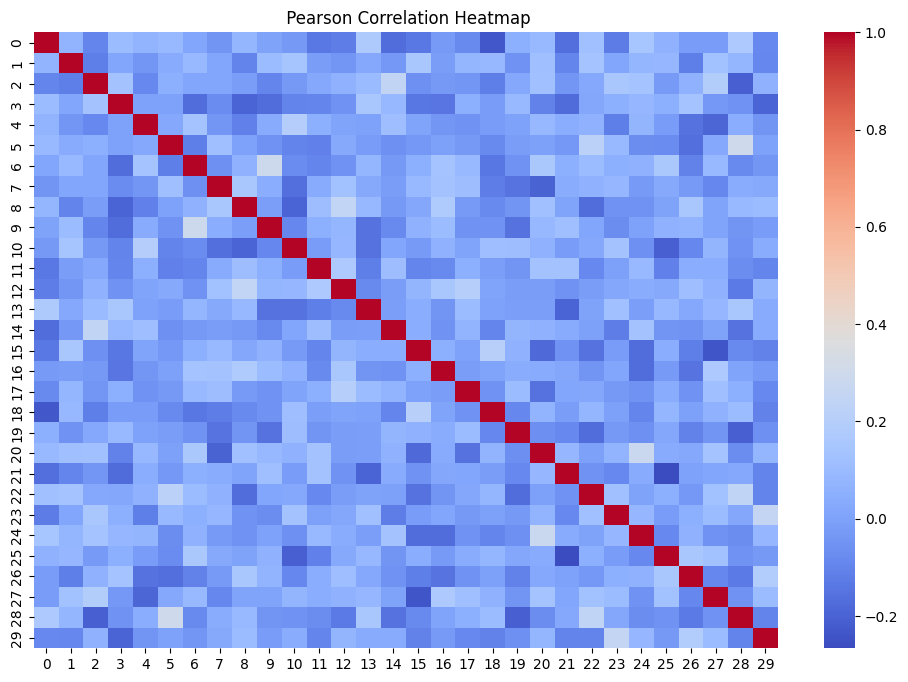

🧮 Columns with correlation ≤ 0.7:
 [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29]
✅ Normalized Data (0 to 10):
          0         1         2         3         4         5         6   \
0  8.686869  5.845570  5.979381  9.639175  3.366834  9.895833  5.175879   
1  8.838384  9.642857  4.175258  4.845361  8.894472  6.177536  7.386935   
2  3.989899  6.581633  5.360825  6.538931  9.346734  6.177536  6.030151   
3  6.414141  6.530612  5.103093  9.020619  3.919598  7.187500  7.437186   
4  5.825589  5.561224  7.628866  6.288660  0.000000  6.927083  5.728643   

         7         8         9   ...        20        21        22        23  \
0  6.428474  5.957419  5.585137  ...  4.070352  8.593750  6.092632  3.908629   
1  7.424242  7.135678  8.383838  ...  9.195980  5.481250  6.092632  6.497462   
2  0.050505  3.266332  8.484848  ...  4.974874  5.481250  6.989796  6.142132   
3  9.393939  5.957419  7.070707  ...  4.723618  0.000

In [ ]:
#PART II. DATA ANALYTICS
#Q12.
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler

# Step 1: Create random dataset of 100 rows and 30 columns in range [1, 200]
np.random.seed(0)
df = pd.DataFrame(np.random.randint(1, 201, size=(100, 30)))

# Step 2: Replace values between 10 and 60 with NaN
df.replace(to_replace=range(10, 61), value=np.nan, inplace=True)

# Step 3: Print count of rows with at least one missing value
missing_rows = df.isnull().any(axis=1).sum()
print("🔢 Number of rows with missing values:", missing_rows)

# Step 4: Replace all NaN values with column average
df_filled = df.fillna(df.mean())
print("🔢 Number of missing values after fill:", df_filled.isnull().sum().sum())


# Step 5: Pearson correlation matrix
corr_matrix = df_filled.corr()

# Plot heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, cmap="coolwarm", annot=False)
plt.title(" Pearson Correlation Heatmap")
plt.show()

# Select columns having correlation <= 0.7 with ANY other column
low_corr_columns = corr_matrix.columns[(corr_matrix.abs() <= 0.7).any()]
print("🧮 Columns with correlation ≤ 0.7:\n", list(low_corr_columns))

# Step 6: Normalize all values between 0 and 10
scaler = MinMaxScaler(feature_range=(0, 10))
df_normalized = pd.DataFrame(scaler.fit_transform(df_filled), columns=df.columns)
print("✅ Normalized Data (0 to 10):\n", df_normalized.head())

# Step 7: Replace values with 1 if ≤ 0.5, else 0
df_binary = (df_normalized <= 0.5).astype(int)

# Final Output Display
print("\n✅ Final Binary Dataset (1 if ≤ 0.5 else 0):")
print(df_binary.head())


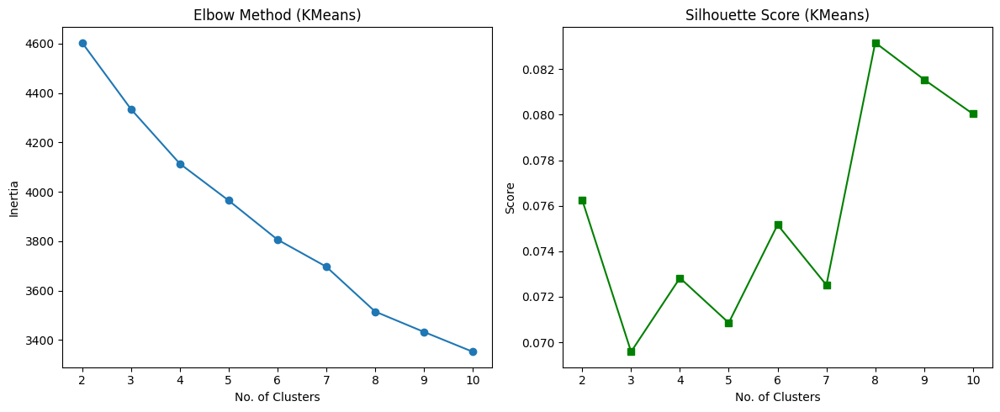

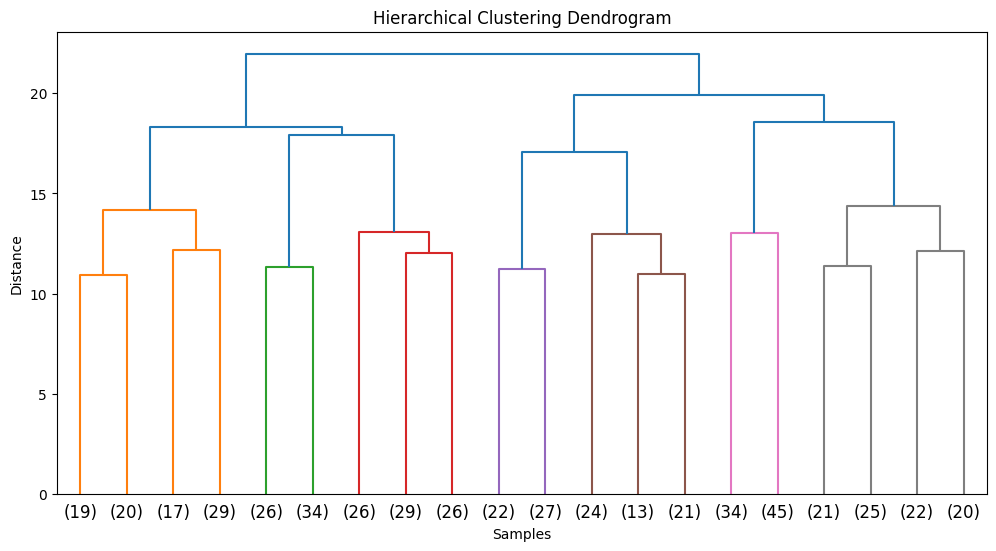

In [ ]:
#Q13.
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score

# Generate data
np.random.seed(42)
data = np.hstack([
    np.random.randint(-10, 11, size=(500, 4)),
    np.random.randint(10, 21, size=(500, 4)),
    np.random.randint(-100, 101, size=(500, 2)),
])
df = pd.DataFrame(data)

# Normalize
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df)

# (i) KMeans Clustering
inertia = []
sil_scores = []
for k in range(2, 11):
    km = KMeans(n_clusters=k, random_state=42)
    km.fit(df_scaled)
    inertia.append(km.inertia_)
    sil_scores.append(silhouette_score(df_scaled, km.labels_))

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(range(2, 11), inertia, marker='o')
plt.title('Elbow Method (KMeans)')
plt.xlabel('No. of Clusters')
plt.ylabel('Inertia')

plt.subplot(1, 2, 2)
plt.plot(range(2, 11), sil_scores, marker='s', color='green')
plt.title('Silhouette Score (KMeans)')
plt.xlabel('No. of Clusters')
plt.ylabel('Score')
plt.tight_layout()
plt.show()

# (ii) Hierarchical Clustering
linked = linkage(df_scaled, method='ward')
plt.figure(figsize=(12, 6))
dendrogram(linked, truncate_mode='lastp', p=20)
plt.title("Hierarchical Clustering Dendrogram")
plt.xlabel("Samples")
plt.ylabel("Distance")
plt.show()


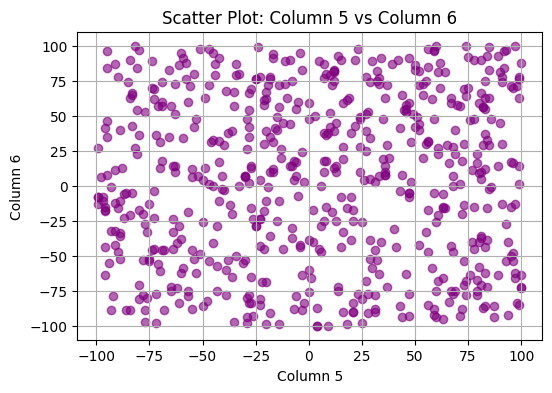

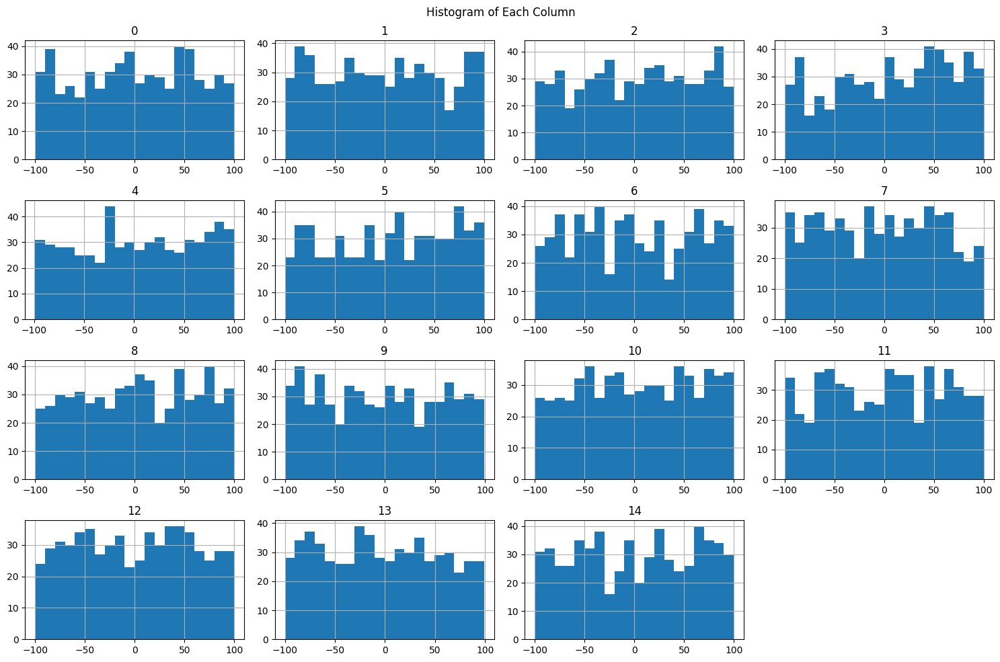

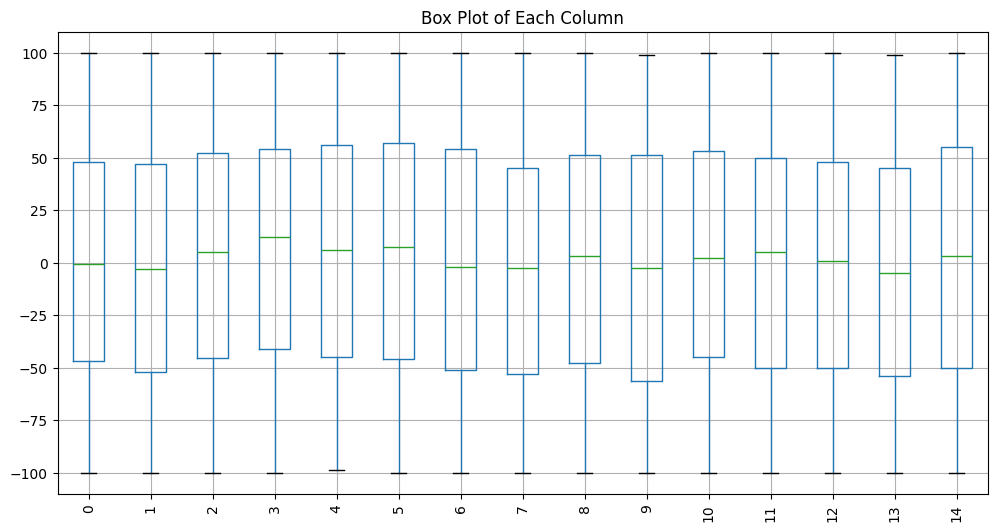

In [26]:
# Q14
np.random.seed(42)
data_q14 = np.random.randint(-100, 101, size=(600, 15))
df_q14 = pd.DataFrame(data_q14)

# (i) Scatter plot between Col 5 and 6
plt.figure(figsize=(6, 4))
plt.scatter(df_q14[4], df_q14[5], alpha=0.6, color='purple')
plt.title("Scatter Plot: Column 5 vs Column 6")
plt.xlabel("Column 5")
plt.ylabel("Column 6")
plt.grid(True)
plt.show()

# (ii) Histogram of each column
df_q14.hist(figsize=(15, 10), bins=20)
plt.suptitle("Histogram of Each Column")
plt.tight_layout()
plt.show()

# (iii) Box plot of each column
plt.figure(figsize=(12, 6))
df_q14.boxplot()
plt.title("Box Plot of Each Column")
plt.xticks(rotation=90)
plt.grid(True)
plt.show()


In [27]:
from scipy.stats import ttest_1samp, wilcoxon, ttest_ind, ranksums

# Q15
np.random.seed(42)
df_q15 = pd.DataFrame(np.random.uniform(5, 10, size=(500, 5)))

# (i) One-sample t-test against population mean = 7.5
print("\nOne-sample t-Test on each column:")
for i in range(5):
    stat, p = ttest_1samp(df_q15[i], 7.5)
    print(f"Column {i+1}: t-stat = {stat:.4f}, p-value = {p:.4f}")

# (ii) Wilcoxon Signed Rank Test against median 7.5
print("\nWilcoxon Signed Rank Test:")
for i in range(5):
    try:
        stat, p = wilcoxon(df_q15[i] - 7.5)
        print(f"Column {i+1}: stat = {stat:.4f}, p-value = {p:.4f}")
    except ValueError:
        print(f"Column {i+1}: Wilcoxon test not valid (zero differences)")

# (iii) Two sample t-test and Wilcoxon rank-sum between col 3 and 4
col3 = df_q15[2]
col4 = df_q15[3]
t_stat, t_p = ttest_ind(col3, col4)
w_stat, w_p = ranksums(col3, col4)
print(f"\nTwo-sample t-Test (Col3 vs Col4): t-stat = {t_stat:.4f}, p = {t_p:.4f}")
print(f"Wilcoxon Rank Sum Test (Col3 vs Col4): stat = {w_stat:.4f}, p = {w_p:.4f}")



One-sample t-Test on each column:
Column 1: t-stat = 0.5041, p-value = 0.6144
Column 2: t-stat = -0.7206, p-value = 0.4715
Column 3: t-stat = 0.0366, p-value = 0.9708
Column 4: t-stat = -0.1038, p-value = 0.9173
Column 5: t-stat = -0.1490, p-value = 0.8816

Wilcoxon Signed Rank Test:
Column 1: stat = 60997.0000, p-value = 0.6145
Column 2: stat = 60213.0000, p-value = 0.4555
Column 3: stat = 62434.0000, p-value = 0.9529
Column 4: stat = 62199.0000, p-value = 0.8951
Column 5: stat = 62175.0000, p-value = 0.8893

Two-sample t-Test (Col3 vs Col4): t-stat = 0.0999, p = 0.9205
Wilcoxon Rank Sum Test (Col3 vs Col4): stat = 0.1191, p = 0.9052
